Basic Imports

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
%matplotlib inline

Camera Calibration
Draw Corners on Calibration images

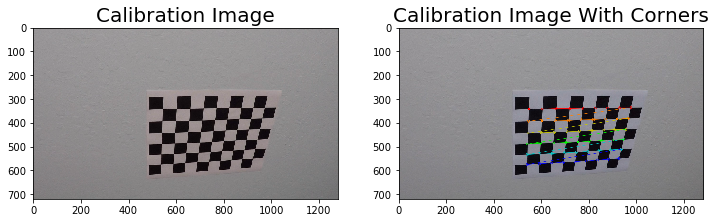

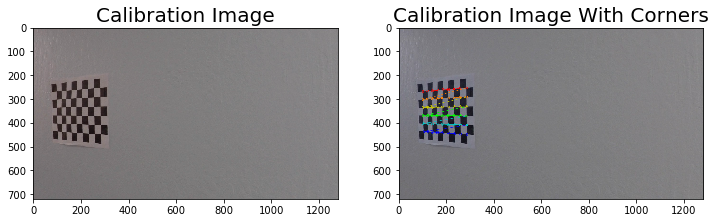

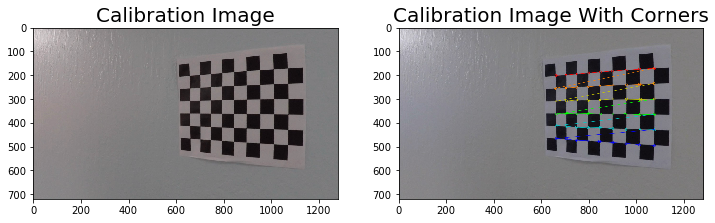

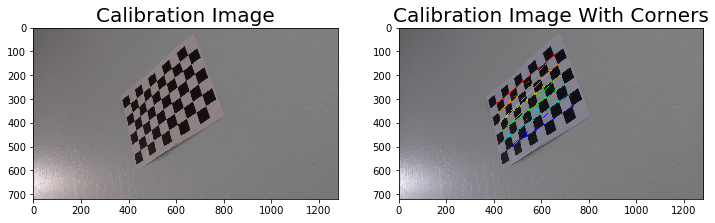

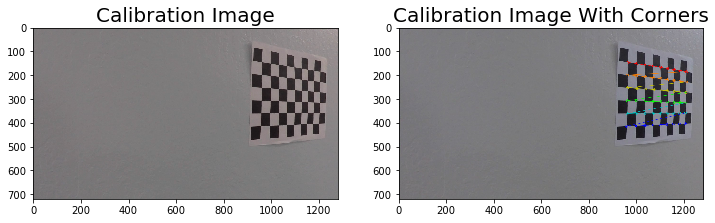

...

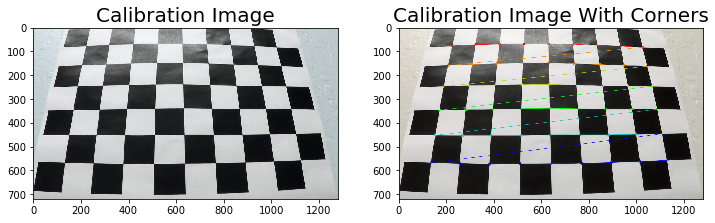

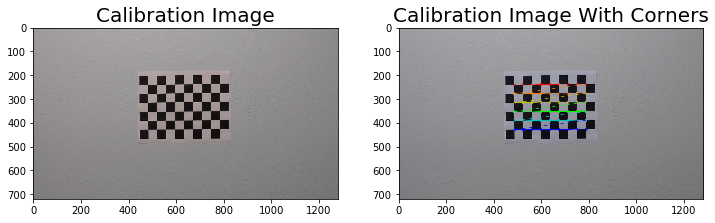

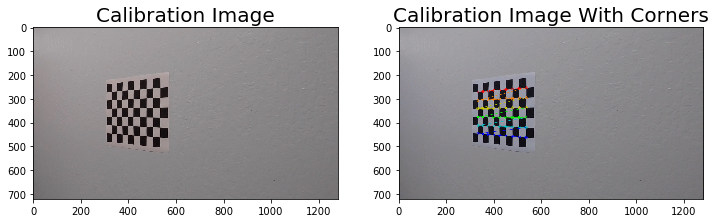

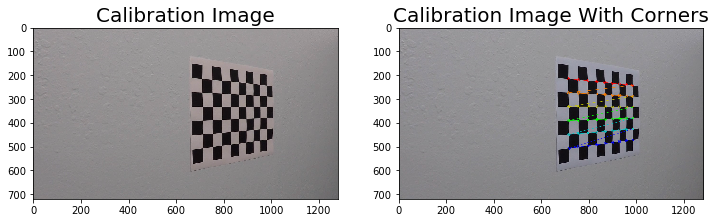

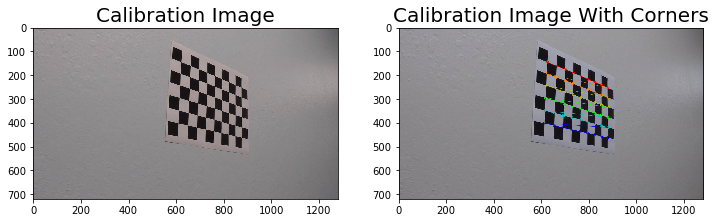

In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))
        ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
        ax1.set_title('Calibration Image', fontsize=20)
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('Calibration Image With Corners', fontsize=20)

Calibrate camera then use mtx and dist coefficients to undistort image

In [3]:
# Function that Corrects distortion
def undistort(image):
    img_size = (image.shape[1], image.shape[0])
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    corrected = cv2.undistort(image, mtx, dist, None, mtx)
    return corrected

Undistort test images and display results

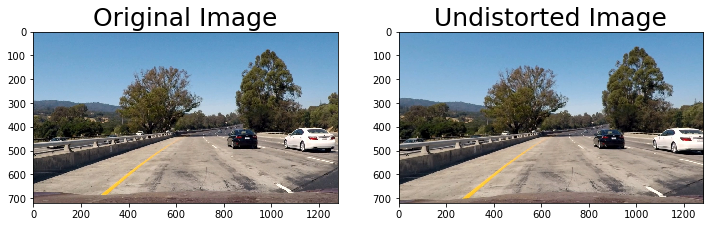

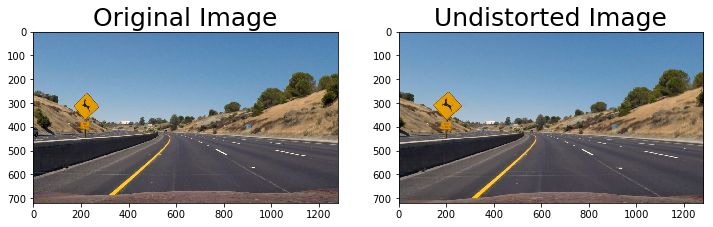

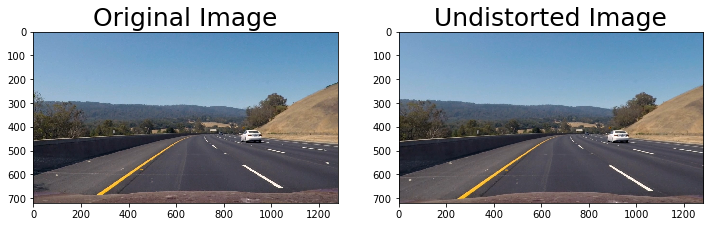

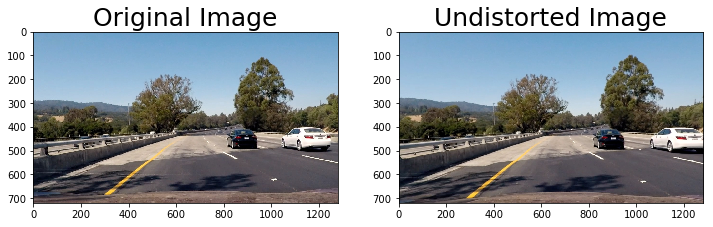

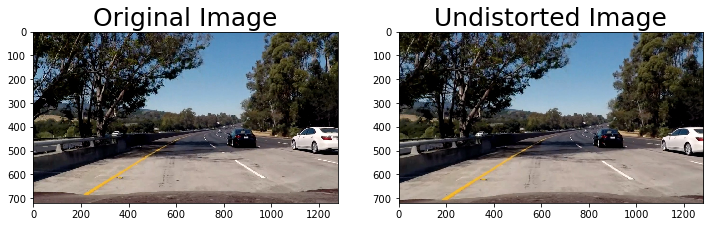

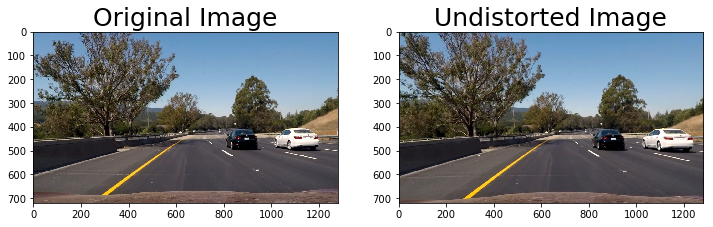

In [4]:
images = glob.glob('test_images/test*.jpg')
for img in images:
    image = cv2.imread(img)
    corrected = undistort(image)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))
    ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=25)
    ax2.imshow(cv2.cvtColor(corrected, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted Image', fontsize=25)

Eyeballing the image and experimeting with src -> dst points to be used for the perspective transform

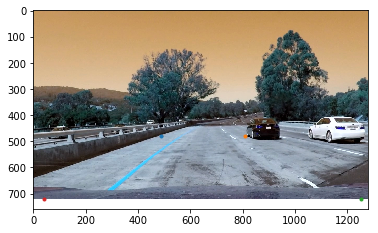

In [5]:
image = cv2.imread('test_images/test1.jpg')

plt.imshow(image)
plt.plot(488, 480,'.')
plt.plot(808, 480,'.')
plt.plot(1252, 722,'.')
plt.plot(42, 722,'.')

In [6]:
# Source points
src = np.float32([[488, 480],[808, 480],
                    [1252, 722],[42, 722]])
# Destination points
dst = np.float32([[0, 0], [1280, 0], 
                     [1252, 722],[42, 722]])

# Define perspective transform and inverse

M = cv2.getPerspectiveTransform(src,dst)
Minv = cv2.getPerspectiveTransform(dst, src)

Let's see how the perspective performs on our test images

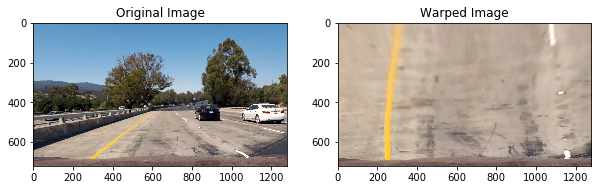

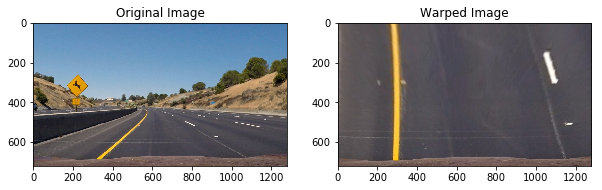

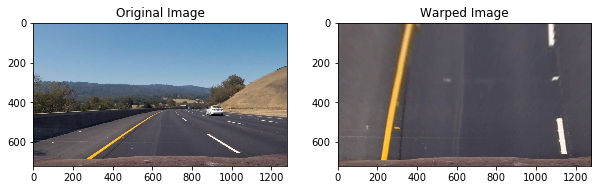

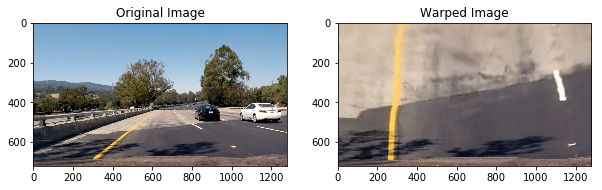

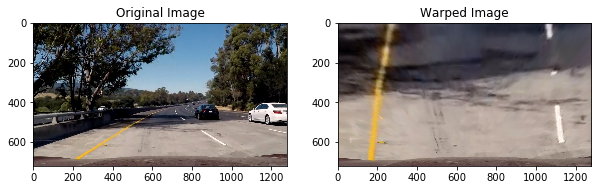

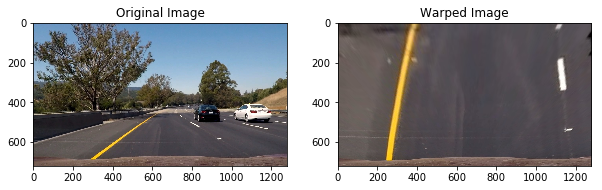

In [7]:
for img in images:
    image = cv2.imread(img)
    img_size = (image.shape[1], image.shape[0])
    plt.figure(figsize=(10,40))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), cmap='gray')
    plt.title('Original Image')
    plt.subplot(1,2,2)
    warped_image = cv2.warpPerspective(image, M, img_size)
    plt.imshow(cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB), cmap='gray')
    plt.title('Warped Image')

Let's explore color thresholding

In [8]:
# Using HLS and LUV colors spaces to filter only white and yellow lines
def color_thershold(img, s_thresh=(178, 255), l_thresh=(227, 255)):
    
    s_channel = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:,:,2]           
    l_channel = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)[:,:,0]
    
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(s_binary == 1) | (l_binary == 1)] = 1
    return combined_binary

Let's see what the following threshold values will give us
s_thresh=(180, 255) 
l_thresh=(200, 255)

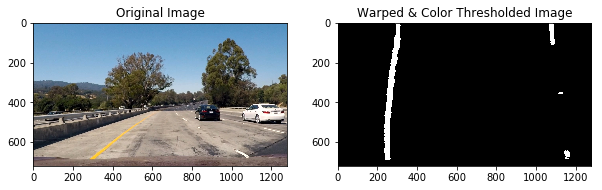

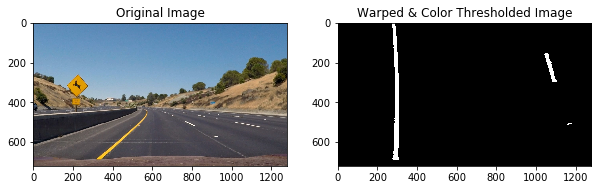

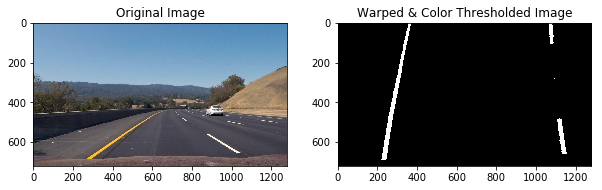

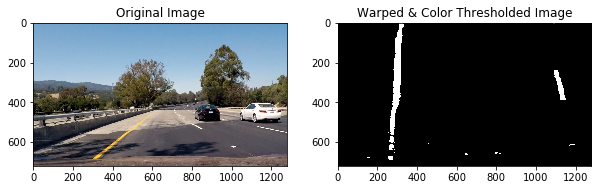

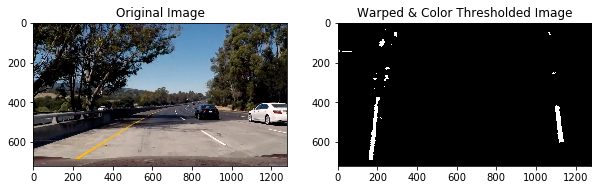

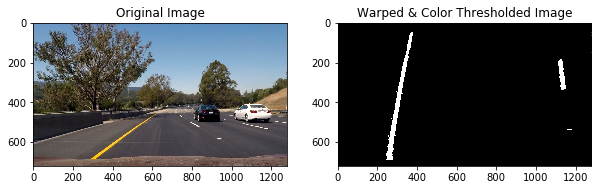

In [9]:
for img in images:
    image = cv2.imread(img)
    plt.figure(figsize=(10,40))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), cmap='gray')
    plt.title('Original Image')
    plt.subplot(1,2,2)
    warped_image = cv2.warpPerspective(image, M, img_size)
    color_thersh_image = color_thershold(warped_image)
    plt.imshow(color_thersh_image, cmap='gray')
    plt.title('Warped & Color Thresholded Image')

Color Thresholding seems to be working pretty well so we'll use it instead of gradient (gradient could work too I just haven't been successful yet to find the right thresholds)

Let's now look at how we can use histogram along columns to detect good candidate lines

In [10]:
def compute_historgram(image):
    img_size = (image.shape[1], image.shape[0])
    warped_image = cv2.warpPerspective(image, M, img_size)
    binary_warped = color_thershold(warped_image)
    hist = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    return hist

Let's run histogram on the test images

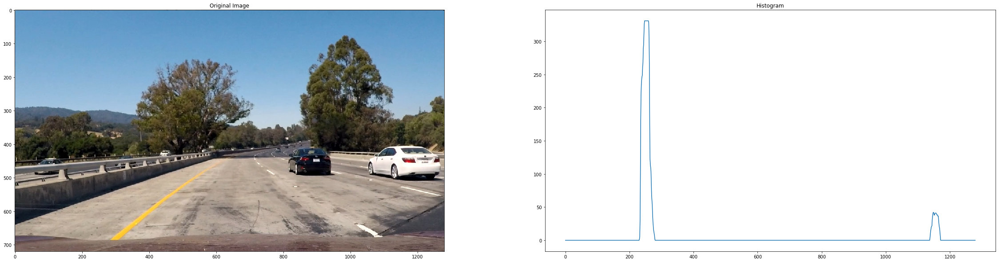

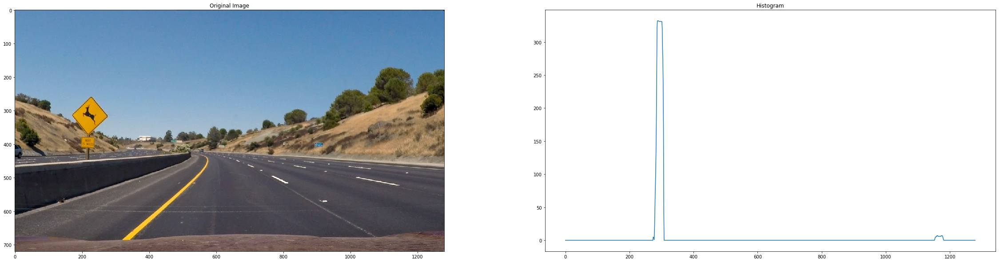

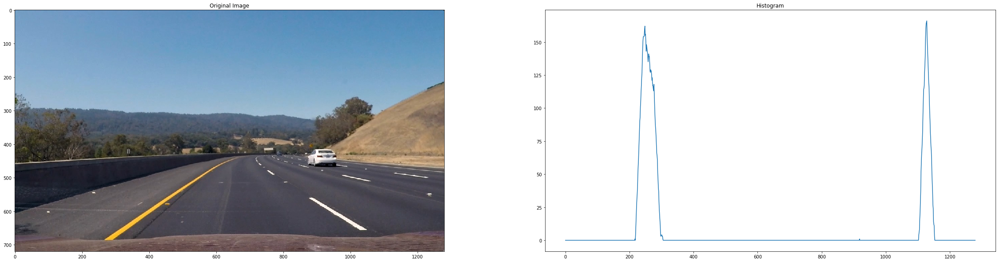

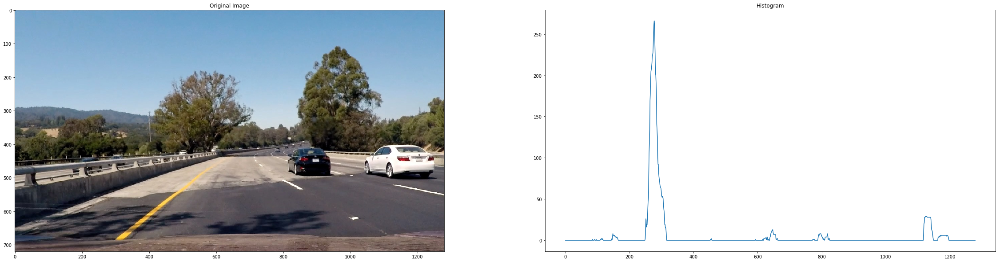

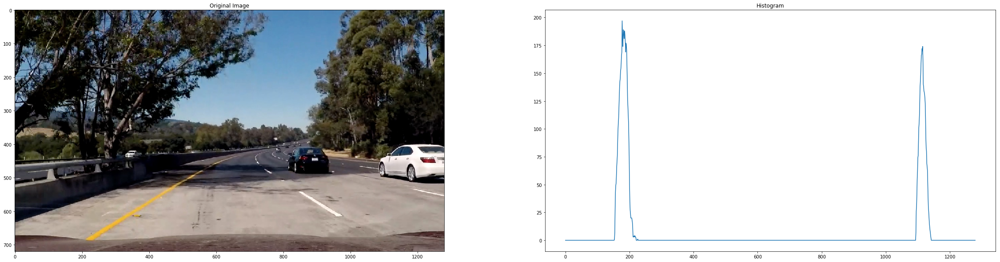

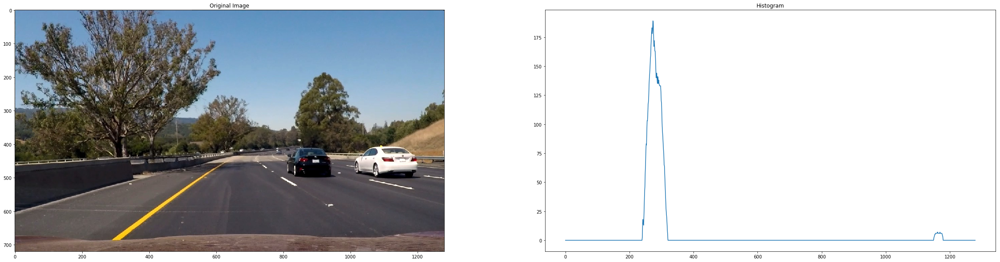

In [11]:
for img in images:
    image = cv2.imread(img)
    plt.figure(figsize=(40,10))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), cmap='gray')
    plt.title('Original Image')
    plt.subplot(1,2,2)
    histogram = compute_historgram(image)
    plt.plot(histogram)
    plt.title('Histogram')

Good news! We can clearly see the lanes in the histograms.
The left lane seem to be way more obvious that the right one so we'll keep that in mind

In [12]:
# named std (standalone) to differentiate it from Lines.searych_lines()
def search_lines(binary_warped):
    
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
        
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return leftx, lefty, rightx, righty, leftx_base, rightx_base


#def visualize_lines(binary_warped, letfx, lefty, rightx, righty):
#    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
#    # Fit a second order polynomial to each
#    left_fit = np.polyfit(lefty, leftx, 2)
#    right_fit = np.polyfit(righty, rightx, 2)
#    # Generate x and y values for plotting
#    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
#    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
#    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
#    out_img[lefty, leftx] = [255, 0, 0]
#    out_img[righty, rightx] = [0, 0, 255]
#    plt.imshow(out_img)
#    plt.plot(left_fitx, ploty, color='yellow')
#    plt.plot(right_fitx, ploty, color='yellow')
 #   plt.xlim(0, 1280)
#    plt.ylim(720, 0)
 #   return


def visualize_lines(binary_warped, left_fit, right_fit):
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    plt.imshow(binary_warped)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    return




Let's see how the lanes will look like

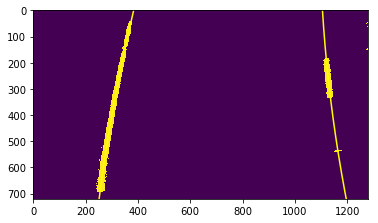

In [13]:
image = cv2.imread('test_images/test6.jpg')
img_size = (image.shape[1], image.shape[0])
warped_image = cv2.warpPerspective(image, M, img_size)
binary_warped = color_thershold(warped_image)
leftx, lefty, rightx, righty, leftx_base, rightx_base = search_lines(binary_warped)
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
visualize_lines(binary_warped, left_fit, right_fit)


In [14]:
# Class Line
# Keep a 10 average of leftx_base rightx_base
# Consider a deviation from average of more than 10% a bad fit
# Keep an average of coefficients

# Polynomial coefficients
from collections import deque

class Lines:
    def __init__(self):
        # Was the line detected in the previous frame?
        # Stores 10 previous values of peak posistions 
        self.l_x_base = deque(maxlen=20)
        self.r_x_base = deque(maxlen=20)
        # Store 10 previous values of polynomial coefficients 
        # the goal of this is to make the variation smooth
        # P(x) = pol0*x^2 + pol1*x + pol2
        self.r_pol0 = deque(maxlen=20)
        self.r_pol1 = deque(maxlen=20)
        self.r_pol2 = deque(maxlen=20)
        
        self.l_pol0 = deque(maxlen=20)
        self.l_pol1 = deque(maxlen=20)
        self.l_pol2 = deque(maxlen=20)
        
        self.l_curvature = 0
        self.r_curvature = 0
        
        self.pos_from_center = 0 
        
        # frame count
        self.count = 0
        
        #Used to compute curvature
        self.lx = []
        self.ly = []
        self.rx = []
        self.ry = []
        
        # Updates the state of the object to reflect the new situation after the frame was processed
    def update(self, image):
        self.lx, self.ly, self.rx, self.ry, leftx_base, rightx_base = search_lines(image)
        left_fit = np.polyfit(self.ly, self.lx, 2)
        right_fit = np.polyfit(self.ry, self.rx, 2)
        self.l_x_base.append(leftx_base)
        self.r_x_base.append(rightx_base)
        self.l_pol0.append(left_fit[0])
        self.l_pol1.append(left_fit[1])
        self.l_pol2.append(left_fit[2])
        # Only append if it's not obviously wrong

        intercept_720 = right_fit[2]*720**2 + right_fit[2]*720 + right_fit[2]
#        print('interecpt 0,720 : ' + str(right_fit[2]) + ',' + str(intercept_720))
        if ((right_fit[2]>=800) & (right_fit[2] <= 1200)):
            self.r_pol0.append(right_fit[0])
            self.r_pol1.append(right_fit[1])
            self.r_pol2.append(right_fit[2])
        elif (len(self.r_pol0)!=0):
            self.r_pol0.pop()
            self.r_pol1.pop()
            self.r_pol2.pop()
        return
    
    # Gives the smoothened pixel posistion to be used
    def evaluate(self, image):
        self.update(image)
        left_fit = [np.mean(self.l_pol0), np.mean(self.l_pol1), np.mean(self.l_pol2)]
        right_fit = [np.mean(self.r_pol0), np.mean(self.r_pol1), np.mean(self.r_pol2)]
        self.position_from_center(left_fit, right_fit)
        return left_fit, right_fit
    
    def position_from_center(self, left_fit, right_fit):
        xm_per_pix = 3.7/660.0 # meters per pixel in x dimension
        y_eval = 700
        midx = 650
        x_left_pix = left_fit[0]*(y_eval**2) + left_fit[1]*y_eval + left_fit[2]
        x_right_pix = right_fit[0]*(y_eval**2) + right_fit[1]*y_eval + right_fit[2]
        self.pos_from_center = ((x_left_pix + x_right_pix)/2 - midx) * xm_per_pix
        return
    
    def draw(self, image):
        left_fit, right_fit = self.evaluate(image)
        ploty = np.linspace(0, image.shape[0]-1, image.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
            
        out_zero = np.zeros_like(image).astype(np.uint8)
        out_img = np.dstack((out_zero, out_zero, out_zero))
            
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])

        pts = np.hstack((pts_left, pts_right))
        
        if ((self.count+6) % 6 == 0):
            self.radius_of_curvature()
        
        # Draw the lane onto the warped blank image
        cv2.fillPoly(out_img, np.int_([pts]), (0, 255, 0))
        self.count = self.count + 1
        return out_img
    
    def radius_of_curvature(self):
        ym_per_pix = 30./720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meteres per pixel in x dimension
        fit_cr_l = np.polyfit(self.ly*ym_per_pix, self.lx*xm_per_pix, 2)
        fit_cr_r = np.polyfit(self.ry*ym_per_pix, self.rx*xm_per_pix, 2)
        self.l_curvature = ((1 + (2*fit_cr_l[0]*np.max(self.ly) + fit_cr_l[1])**2)**1.5) \
                                     /np.absolute(2*fit_cr_l[0])
        self.r_curvature = ((1 + (2*fit_cr_r[0]*np.max(self.ry) + fit_cr_r[1])**2)**1.5) \
                                     /np.absolute(2*fit_cr_r[0])    
        return
        
    def search_lines(self, image):
        # Assuming you have created a warped binary image called "binary_warped"
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint 
        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        # Set the width of the windows +/- margin
        margin = 100
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []
        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                              (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                               (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
                # Concatenate the arrays of indices
                left_lane_inds = np.concatenate(left_lane_inds)
                right_lane_inds = np.concatenate(right_lane_inds)
                # Extract left and right line pixel positions
                
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        return leftx, lefty, rightx, righty, leftx_base, rightx_base
       


In [15]:
Lines_Mem = Lines() 
def process_video(img):
    image = undistort(img)
    img_size = (image.shape[1], image.shape[0])
    warped_image = cv2.warpPerspective(image, M, img_size)
    binary_warped = color_thershold(warped_image)
    warped_lanes = Lines_Mem.draw(binary_warped)
    newwarp = cv2.warpPerspective(warped_lanes, Minv, (image.shape[1], image.shape[0]))     
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    
    position_from_center = Lines_Mem.pos_from_center
    
    if position_from_center < 0:
        text = 'left'
    else:
        text = 'right'
    cv2.putText(result,'Distance From Center: %.2fm %s' % (np.absolute(position_from_center), text),(20,80), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2)
    
    # Print radius of curvature on video
    curvature = (Lines_Mem.l_curvature+Lines_Mem.r_curvature)/2
    cv2.putText(result, 'Curvature {}(m)'.format(int(curvature)), (120,140),cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2)    
    return result

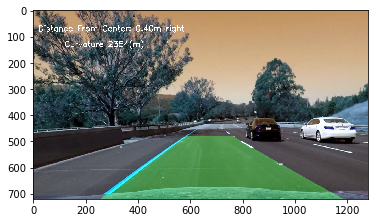

In [16]:
image = cv2.imread('test_images/test6.jpg')
out = process_video(image)
plt.imshow(out)

In [17]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

Lines_Mem = Lines()
curvature = 0

white_output = 'project_video_result.mp4'
clip1 = VideoFileClip("./project_video.mp4")
white_clip = clip1.fl_image(process_video)
%time white_clip.write_videofile(white_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))


[MoviePy] >>>> Building video project_video_result.mp4
[MoviePy] Writing video project_video_result.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [10:27<00:00,  2.02it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_result.mp4 

Wall time: 10min 27s
